In [2]:


import matplotlib.pyplot as plt
import numpy as np
import os, sys, cv2

import json
%matplotlib inline
label_set = {'people', 'person', 'person-fa', 'person?'}
gt_annotation = json.load(open("/root/data/caltech-pedestrian-dataset-converter/data/annotations.json"))

In [18]:


def get_frames_by_label(gt_annotation, label="all", set_list =None):
    target_frames = []
    if not set_list:
        set_list = gt_annotation.keys()
    for set_num in set_list:
        set_annotation = gt_annotation[set_num]
        for v_num, v_annotation in set_annotation.items():
            for frame_num, frame in v_annotation["frames"].items():
                for box in frame:
                    if label == "all" or box['lbl'] == label and verify_reasonable(box):
                        frame_name = "{}_{}_{}.jpg".format(set_num, v_num, frame_num)
                        target_frames.append((frame_name, frame))
                        break

    
    return target_frames

def get_boxes_by_label(gt_annotation, label ="all", set_list = None):
    target_boxes = []
    if not set_list:
        set_list = gt_annotation.keys()
    
    for set_num in set_list:
        set_annotation = gt_annotation[set_num]
        print(set_num)
        for v_num, v_annotation in set_annotation.items():
            for frame_num, frame in v_annotation["frames"].items():
                for box in frame:
                    
                    if label== "all" or box["lbl"] == label and verify_reasonable(box):
                        frame_name = "{}_{}_{}.jpg".format(set_num, v_num, frame_num)
                        target_boxes.append((frame_name, box))
    return target_boxes    




def render_frame(frame_name, boxes):
    images_path = "/root/data/caltech-pedestrian-dataset-converter/data/images"
    frame_path = os.path.join(images_path, frame_name)
    im = cv2.imread(frame_path)[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    
    label_to_color = {"people": "red", "person": "green", "person-fa": "blue", "person?": "yellow"}
    
    for box in boxes:
        x1 = box['pos'][0]
        y1 = box['pos'][1]
        width = box['pos'][2]
        length = box['pos'][3]
        label = box['lbl']
        color = label_to_color[label]
        rectangle = plt.Rectangle((x1,y1), width,length, fill=False, edgecolor=color, linewidth=3.5)
        ax.add_patch(rectangle)
        ax.text(x1, y1 - 2, label,
                bbox=dict(facecolor=color, alpha=0.5),
                fontsize=14, color='white')
        
        
        
    
    ax.set_title(frame_name)  
    plt.axis('off')
    plt.tight_layout()
    plt.draw()
        
    


def verify_reasonable(box):
    def verity_bnds(pos):
        bnds = [5, 5, 635, 475]
        return pos[0] >= bnds[0] and pos[0] + pos[2] <= bnds[2] and pos[1] >= bnds[1] and pos[1] +pos[3]<= bnds[3] 

    height_min = 50
    visiable_min = .65
    pos = box['pos']
    pos_v = box['posv']
    occl = box['occl']
    label = box["lbl"]


    pos_area = pos[2] * pos[3]
    try:
        if occl == 0 or all(x==0 for x in pos_v):
            return True
        pos_v_area = pos_v[2] * pos_v[3]
        visiable_ratio = (pos_v_area / pos_area)
    except:
        return False
    return visiable_ratio > visiable_min and pos[3] > height_min and verity_bnds(pos) 




    

In [7]:
label_2_frame_counts = dict([(label, len(get_frames_by_label(gt_annotation, label))) for label in label_set])
label_2_frame_counts 

{'people': 35970, 'person': 122187, 'person-fa': 2850, 'person?': 7539}

In [ ]:
person_fa = get_frames_by_label(gt_annotation, "person-fa")


KeyboardInterrupt: 

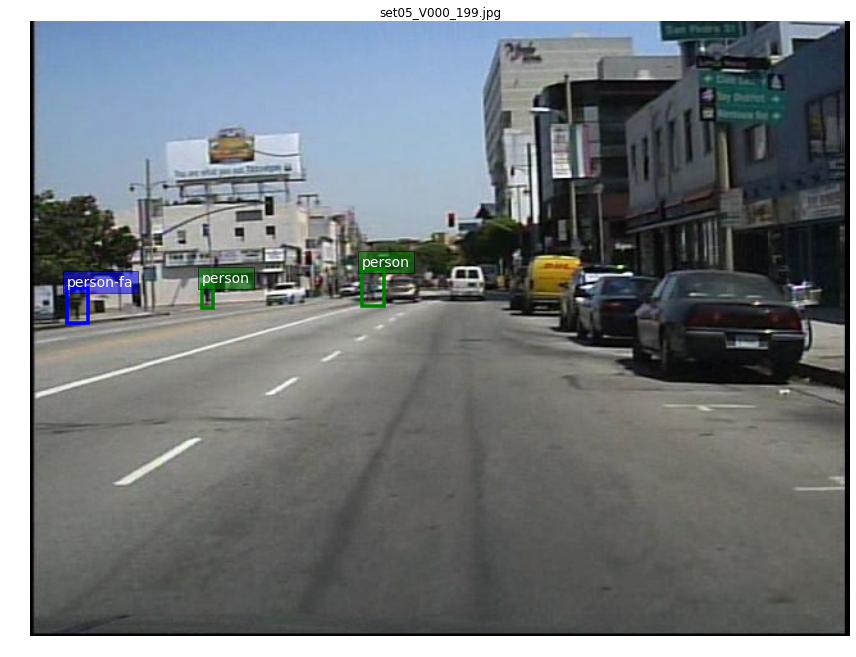

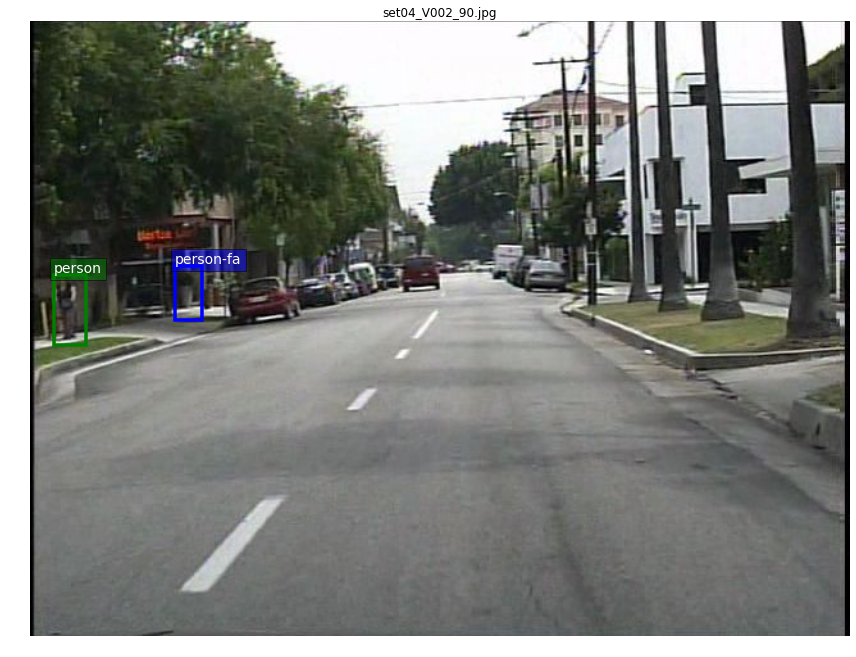

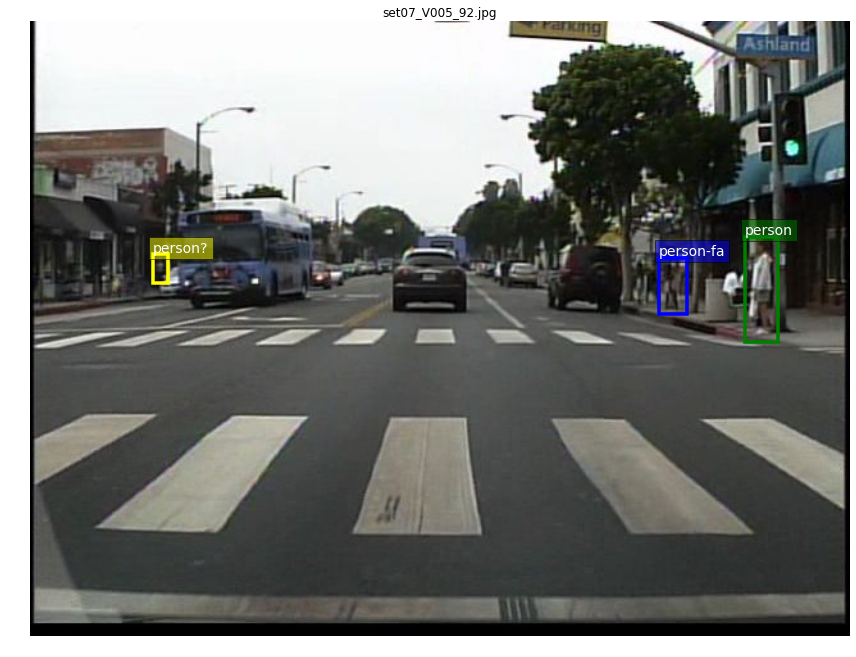

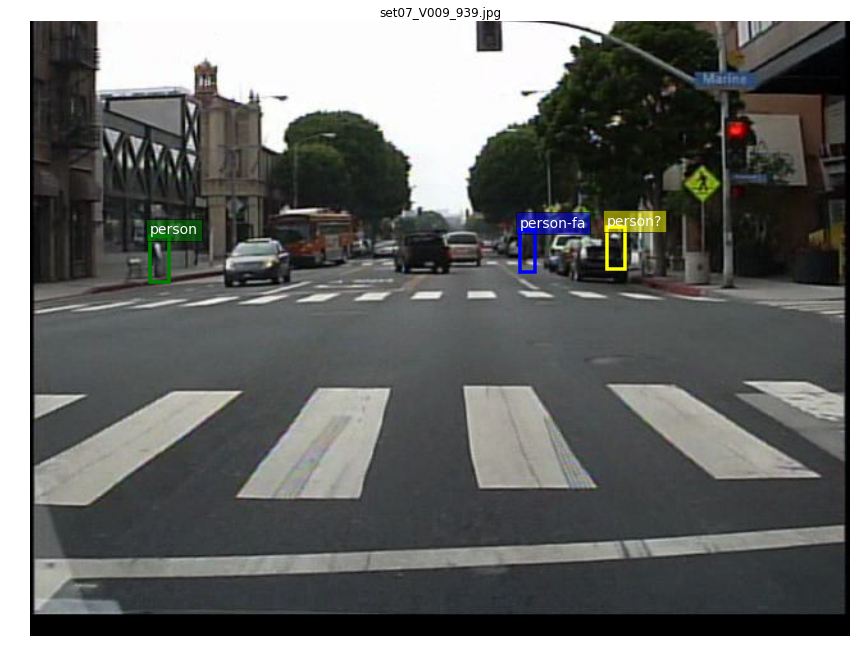

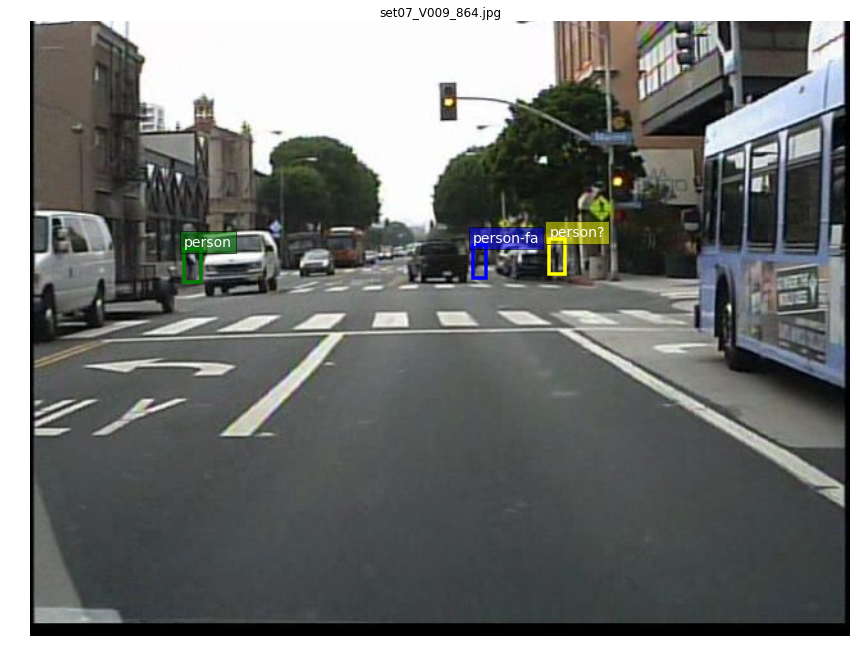

...

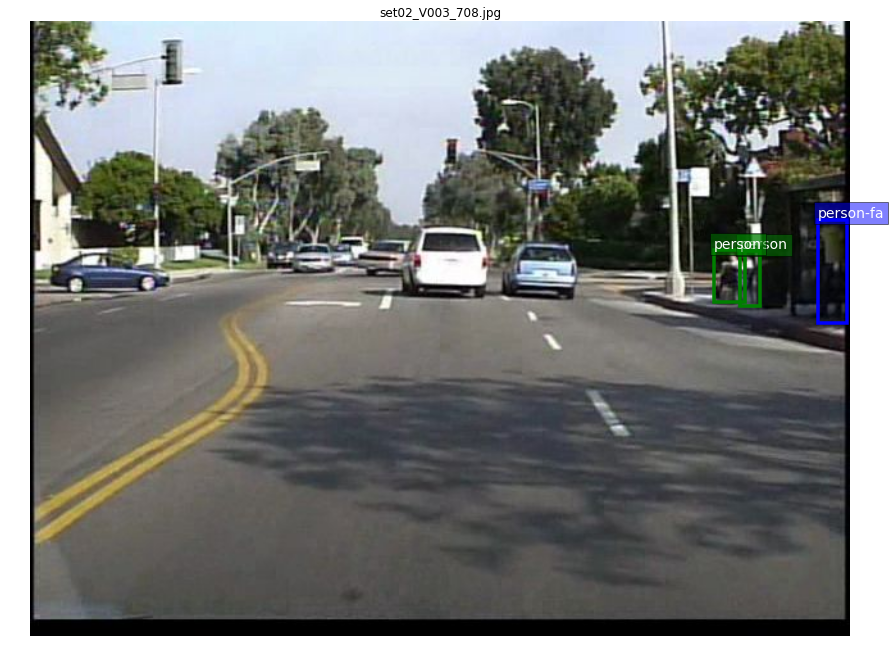

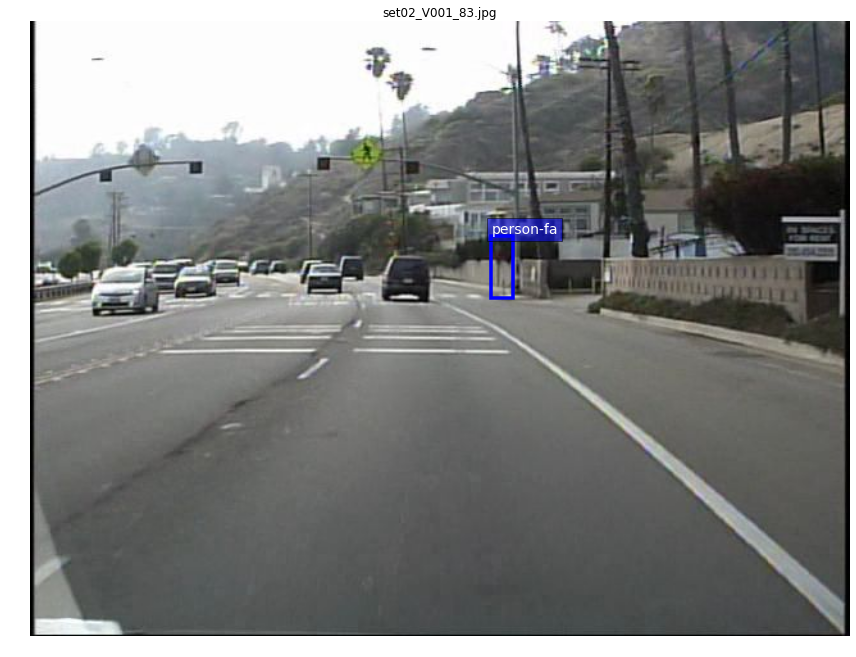

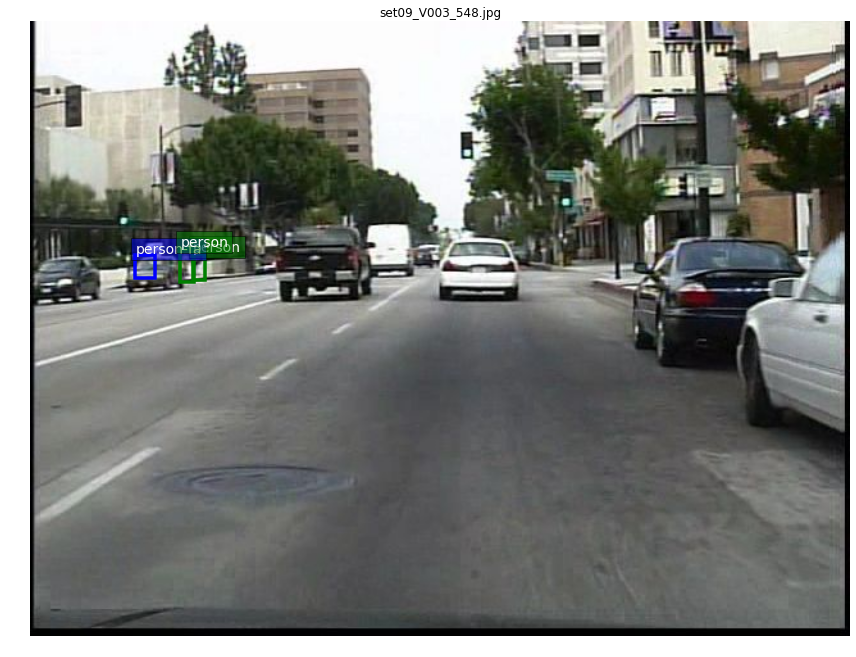

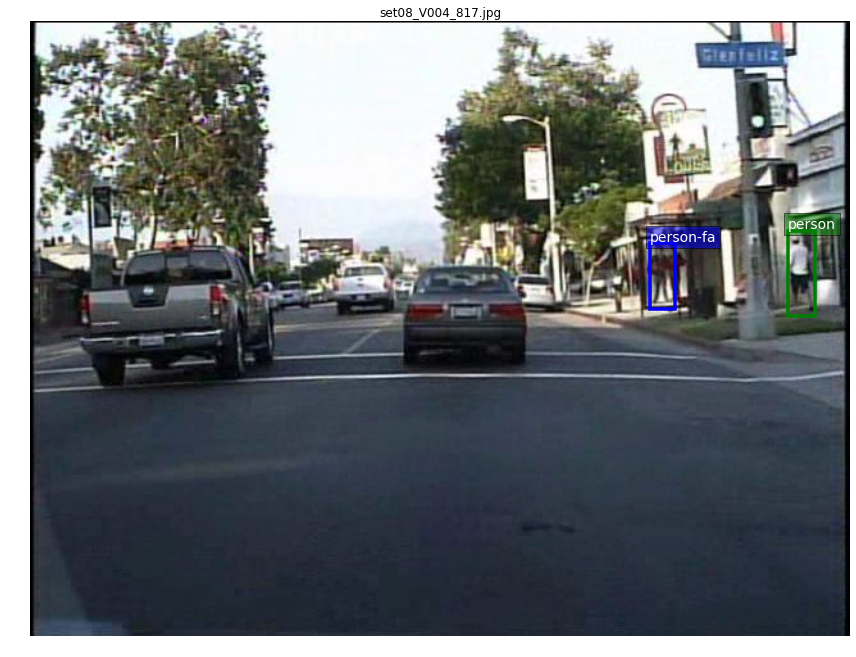

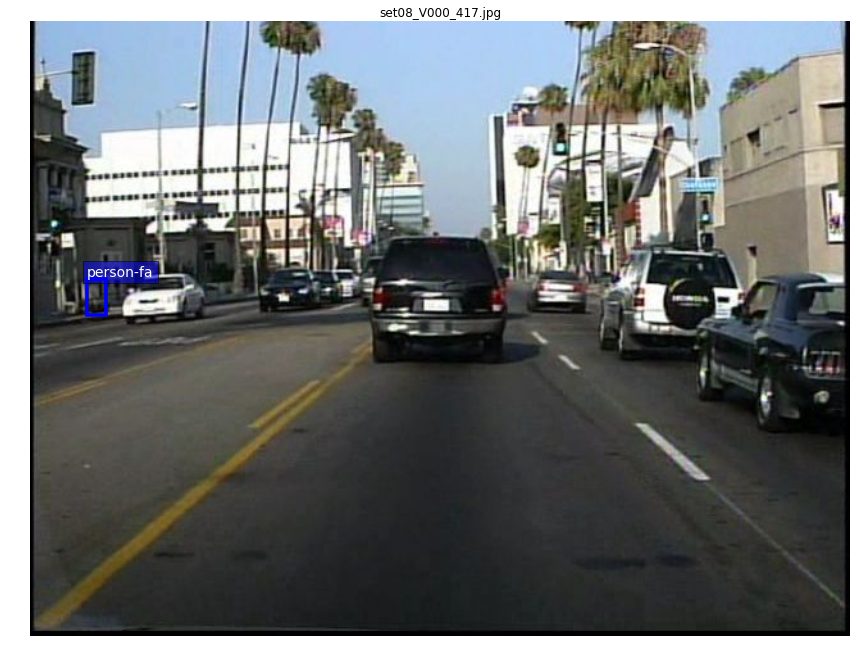

In [8]:
for person_fa in get_frames_by_label(gt_annotation, "person-fa")[::120]:
    frame_name = person_fa[0]
    boxes = person_fa[1]
    render_frame(frame_name, boxes)

In [ ]:
for person_fa in get_frames_by_label(gt_annotation, "person?")[::120][:10]:
    frame_name = person_fa[0]
    boxes = person_fa[1]
    render_frame(frame_name, boxes)

In [10]:
training_sets = ["set0{}".format(i) for i in range(0,6)]


In [19]:
all_boxes = get_boxes_by_label(gt_annotation, set_list=training_sets, label="person")
all_frames = get_frames_by_label(gt_annotation, set_list=training_sets, label="person")
print(len(all_boxes), len(all_frames))

set00
set01
set02
set03
set04
set05
(99282, 47644)


In [ ]:
len(positive_boxes)

In [ ]:
all_boxes = get_boxes_by_label(gt_annotation)
len(all_boxes)

In [ ]:
posv_count = 0
for frame_name, box in positive_boxes:
    
    posv = box["posv"]
    if posv != [0,0,0,0]:
        posv_count += 1
posv_count

In [ ]:
float(63502) / 192185

In [ ]:
.65

In [ ]:
sum([reasonable_verify(box) for frame_namem, box in positive_boxes])

In [ ]:
box

In [ ]:
bool(0)

In [ ]:
min([    box["pos"][1] for _, box in all_boxes])